

> # Optimizacion Heuristica 
## Integrantes
Juan pablo Buitrago.

Jorge Andrés Higuita Monsalve.

Daniel Arango.




> # Parte 1: Optimizacion Numerica.

In [1]:
#Primero importamos algunas librerias
import random
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from matplotlib.colors import LogNorm
import matplotlib.animation as animation
from IPython.display import HTML
from deap import algorithms, base, creator, tools
from pyswarm import pso
from scipy.optimize import minimize

ModuleNotFoundError: No module named 'matplotlib'

##Función Rastrigin

In [82]:
def f_rastrigin2d(x1, x2):
  y = 20 + x1 ** 2 - 10 * np.cos(2 * np.pi * x1) + x2 ** 2 - 10 * np.cos(2 * np.pi * x2)
  return y

def f_rastrigin3d(x1,x2,x3):
  y = 20 + x1 ** 2 - 10 * np.cos(2 * np.pi * x1) + x2 ** 2 - 10 * np.cos(2 * np.pi * x2) + x3 ** 2 - 10 * np.cos(2 * np.pi * x3)
  return y

n = 50
x1 = np.linspace(-5.12, 5.12, n)
x2 = np.linspace(-5.12, 5.12, n)

X1, X2 = np.meshgrid(x1, x2)
X = np.vstack((X1.flatten(), X2.flatten())).T
z = f_rastrigin2d(X[:, 0], X[:, 1])
Z = z.reshape(n, n)

###Funcion Rastrigin 2D

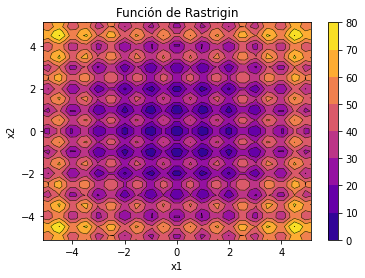

In [83]:
# Crear un gráfico de contorno con valores numéricos
levels = np.arange(0, 90, 10)
cp = plt.contourf(x1, x2, Z, levels=levels, cmap='plasma')
plt.colorbar(cp)

# Agregar líneas de contorno
plt.contour(x1, x2, Z, levels=levels, colors='k', linewidths=0.5)

# Título y etiquetas de los ejes
plt.title("Función de Rastrigin")
plt.xlabel("x1")
plt.ylabel("x2")

# Mostrar el gráfico
plt.show()

###Función Rastrigin 3D

In [84]:
# Cálculo de la función
z = f_rastrigin2d(X1, X2)

# Creación de la figura
fig = go.Figure(data=[go.Surface(x=X1, y=X2, z=z)])

# Personalización de la figura
fig.update_layout(
    title='Función de Rastrigin 2D',
    scene = dict(
        xaxis_title='X1',
        yaxis_title='X2',
        zaxis_title='Y',
        aspectmode='cube',
        camera=dict(
            eye=dict(x=1.75, y=-1.75, z=1.25)
        )
    )
)

# Mostrar la figura
fig.show()

##Optimización funcion Rastrigin

###Descenso por gradiente

####En 2 dimensiones

<p>Vamos a usar el metodo de descenso de gradiente llamado gradiente conjugado no lineal (NCG), ya que es especialmente efectiva para minimizar funciones no lineales como la función de Rastrigin.</p>

In [85]:
def rastrigin(x):
    n = len(x)
    return 10*n + np.sum(x**2 - 10*np.cos(2*np.pi*x))

def gradient(x):
    n = len(x)
    grad = np.zeros(n)
    for i in range(n):
        grad[i] = 2*x[i] + 20*np.pi*np.sin(2*np.pi*x[i])
    return grad

def hessian(x):
    n = len(x)
    hess = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            if i == j:
                hess[i][i] = 2 + 40*np.pi**2*np.cos(2*np.pi*x[i])
            else:
                hess[i][j] = 0
    return hess

def optimize_rastrigin(initial_guess, max_iterations, tolerance=1e-6):
    x = initial_guess
    path = [x]
    for i in range(max_iterations):
        grad = gradient(x)
        hess = hessian(x)
        step = np.linalg.solve(hess, -grad)
        x_new = x + step
        if np.linalg.norm(x_new - x) < tolerance:
            break
        x = x_new
        path.append(x)
    return x, path

Init value: [ 0.23577241 -0.99890155]
Minimum: [-1.50764042 -0.99495864]
Function value at minimum: 23.25641794188016
Optimization path: 
Punto evaluado:[ 0.23577241 -0.99890155]-- Valor de la función en el punto: 10.160875251750356
Punto evaluado:[-1.45715832 -0.99495937]-- Valor de la función en el punto: 22.75815645137749
Punto evaluado:[-1.50899589 -0.99495864]-- Valor de la función en el punto: 23.256057744051798
Punto evaluado:[-1.50764042 -0.99495864]-- Valor de la función en el punto: 23.25641794188016


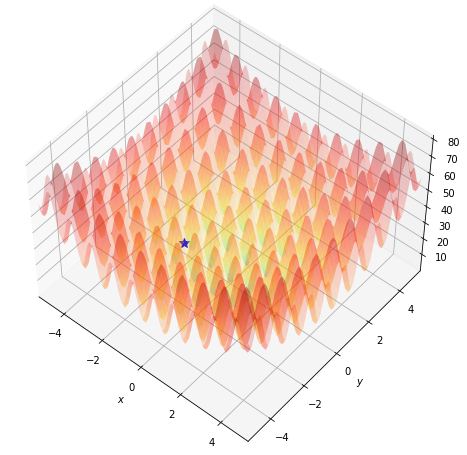

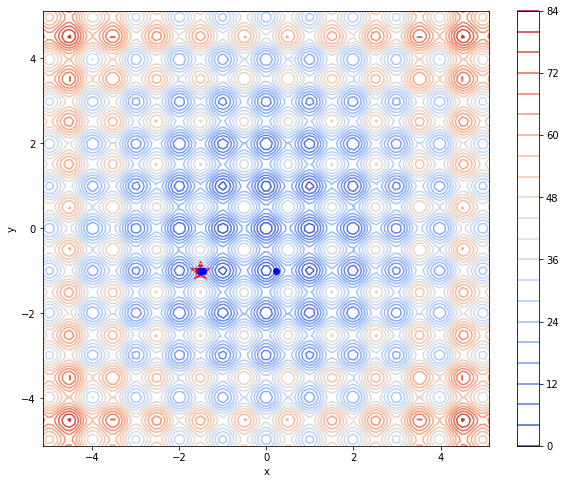

In [86]:
rastrigin_init_point_2D = np.random.uniform(-5.12, 5.12, size=2) #Se genera un número aleatorio y se acota entre el dominio de la función
max_iterations = 1000  
rastrigin_min_2D,rastrigin_path_2D = optimize_rastrigin(rastrigin_init_point_2D, 1000)

#Impresión de resultados
print(f"Init value: {rastrigin_init_point_2D}")
print(f"Minimum: {rastrigin_min_2D}")
print(f"Function value at minimum: {rastrigin(rastrigin_min_2D)}")
print("Optimization path: ")
for point in rastrigin_path_2D:
    print(f"Punto evaluado:{point}--", f"Valor de la función en el punto: {rastrigin(point)}")

    # Generate a grid of x, y values
rtg_x_min, rtg_x_max, rtg_x_maxvalues = -5.12, 5.12, 100
rtg_y_min, rtg_y_max, rtg_y_maxvalues = -5.12, 5.12, 100

x_rastrigin = np.linspace(rtg_x_min, rtg_x_max, rtg_x_maxvalues)
y_rastrigin = np.linspace(rtg_y_min, rtg_y_max, rtg_y_maxvalues)
X_rastrigin, Y_rastrigin = np.meshgrid(x_rastrigin, y_rastrigin)
# Compute the Rastrigin function for each (x, y) pair
Z_rastrigin = np.zeros_like(X_rastrigin)
for i in range(X_rastrigin.shape[0]):
    for j in range(X_rastrigin.shape[1]):
        Z_rastrigin[i, j] = rastrigin(np.array([X_rastrigin[i, j], Y_rastrigin[i, j]]))

rastrigin_minimum= rastrigin_min_2D.reshape(-1, 1)

#Test plot

rastrigin_surface_fig = plt.figure(figsize=(10,8))
rastrigin_surface_axes = plt.axes(projection='3d', elev=50, azim=-50)

rastrigin_surface_axes.plot_surface(X_rastrigin, Y_rastrigin, Z_rastrigin, norm=LogNorm(), rstride=1, cstride=1, 
                edgecolor='none', alpha=.2, cmap=plt.cm.jet)
rastrigin_surface_axes.plot(*rastrigin_minimum, rastrigin(rastrigin_minimum), 'b*', markersize=10)

rastrigin_surface_axes.set_xlabel('$x$')
rastrigin_surface_axes.set_ylabel('$y$')
rastrigin_surface_axes.set_zlabel('$z$')

rastrigin_surface_axes.set_xlim((rtg_x_min, rtg_x_max))
rastrigin_surface_axes.set_ylim((rtg_y_min, rtg_y_max))

plt.show()

# Create a 2D contour plot of the Rastrigin function and plot the ptimization path
rastrigin_contour_fig, rastrigin_contour_axes = plt.subplots(figsize=(10,8))
contour = rastrigin_contour_axes.contour(X_rastrigin, Y_rastrigin, Z_rastrigin, levels=20, cmap='coolwarm')
rastrigin_contour_axes.set_xlabel('x')
rastrigin_contour_axes.set_ylabel('y')

for point in rastrigin_path_2D:
  rastrigin_contour_axes.plot(*point, 'o-',color='blue',alpha=1)  

# Add a marker for the global minimum at (0, 0)
rastrigin_contour_axes.scatter(*rastrigin_minimum, marker='*', s=500, color='red')
plt.colorbar(contour)
plt.show()

####Animacion descenso

<ipython-input-87-48ae464a012b>:4: MatplotlibDeprecationWarning:

Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later

<ipython-input-87-48ae464a012b>:4: MatplotlibDeprecationWarning:

Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later



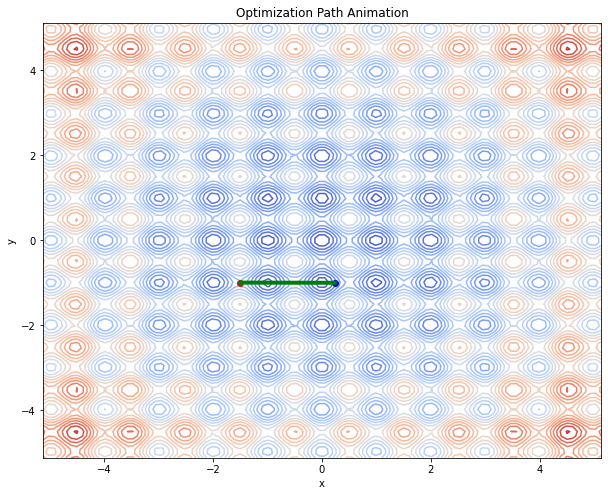

In [87]:
# Define the function to update the animation
def update(frame):
    x = rastrigin_path_2D[frame]
    line.set_data(x[0], x[1])
    if frame > 0:
        line_trace.set_data([rastrigin_path_2D[i][0] for i in range(frame+1)], [rastrigin_path_2D[i][1] for i in range(frame+1)])
    return line, line_trace
# Set the starting point for the optimization
# x_start = np.array([-4, 4])

# Run the optimization
# x_opt, path = newton_raphson_optimization(x_start)

# Plot the contour and the starting point
rastrigin_contour_fig, rastrigin_contour_axes = plt.subplots(figsize=(10,8))
rastrigin_contour_axes.set_title('Optimization Path Animation')
rastrigin_contour_axes.set_xlabel('x')
rastrigin_contour_axes.set_ylabel('y')
rastrigin_contour = rastrigin_contour_axes.contour(X_rastrigin, Y_rastrigin, Z_rastrigin, levels=20, cmap='coolwarm')
rastrigin_contour_axes.plot(rastrigin_init_point_2D[0], rastrigin_init_point_2D[1], 'o', color='blue')

# Set up the animation

line, = rastrigin_contour_axes.plot([], [], 'o-', color='red', lw=10)
line_trace, = rastrigin_contour_axes.plot([], [], '-', color='green', lw=4)
ani = animation.FuncAnimation(rastrigin_contour_fig, update, frames=len(rastrigin_path_2D), interval=500, blit=True)

HTML(ani.to_jshtml())

####En 3 dimensiones

In [88]:
rastrigin_init_point_3D = np.random.uniform(-5.12, 5.12, size=3) #Se genera un número aleatorio y se acota entre el dominio de la función
rastrigin_min_3D,rastrigin_path_3D = optimize_rastrigin(rastrigin_init_point_3D, 1000)

#Impresión de resultados
print("Init value", rastrigin_init_point_3D)
print("Minimum:", rastrigin_min_3D)
print("Function value at minimum:", rastrigin(rastrigin_min_3D))
print("Optimization path: ")
for point in rastrigin_path_3D:
    print(f"Punto evaluado:{point}--", f"Valor de la función en el punto: {rastrigin(point)}")

Init value [-4.80613118 -3.10914204  3.71573279]
Minimum: [-4.9746914 -2.9848557  2.9848557]
Function value at minimum: 42.78292541751628
Optimization path: 
Punto evaluado:[-4.80613118 -3.10914204  3.71573279]-- Valor de la función en el punto: 67.51525957879431
Punto evaluado:[-5.16281289 -2.95954371  3.0605641 ]-- Valor de la función en el punto: 50.609054805352535
Punto evaluado:[-4.85472365 -2.98526882  2.9806333 ]-- Valor de la función en el punto: 45.365754526685386
Punto evaluado:[-5.01906344 -2.98485575  2.98486202]-- Valor de la función en el punto: 43.17184975025804
Punto evaluado:[-4.9745252 -2.9848557  2.9848557]-- Valor de la función en el punto: 42.782930828023936
Punto evaluado:[-4.9746914 -2.9848557  2.9848557]-- Valor de la función en el punto: 42.78292541751628


###Algoritmos evolutivos

####En 2 dimensiones

In [89]:
# Definir los límites de los parámetros
limite_inferior = -5.0
limite_superior = 5.0

# Definir los parámetros del algoritmo genético
num_generaciones = 50
tamano_poblacion = 100
probabilidad_mutacion = 0.2
probabilidad_cruce = 0.5

# Crear los tipos de objeto para el problema
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individuo", list, fitness=creator.FitnessMin)

# Crear la caja de herramientas del algoritmo genético
toolbox = base.Toolbox()
toolbox.register("attr_float", random.uniform, limite_inferior, limite_superior)
toolbox.register("individuo", tools.initCycle, creator.Individuo,
                 (toolbox.attr_float, toolbox.attr_float), n=1)
toolbox.register("poblacion", tools.initRepeat, list, toolbox.individuo)

# Definir la función de evaluación
def evaluar(individuo):
    return f_rastrigin2d(individuo[0], individuo[1]),

# Definir los operadores genéticos
toolbox.register("evaluate", evaluar)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.1)
toolbox.register("select", tools.selTournament, tournsize=3)

# Crear la población inicial
poblacion = toolbox.poblacion(n=tamano_poblacion)

# Ejecutar el algoritmo genético
for generacion in range(num_generaciones):
    # Seleccionar a los padres
    padres = toolbox.select(poblacion, len(poblacion))
    # Clonar los padres para aplicar operadores genéticos
    hijos = list(map(toolbox.clone, padres))

    # Aplicar cruce y mutación a los hijos
    for hijo in hijos:
        if random.random() < probabilidad_cruce:
            toolbox.mate(hijo, random.choice(hijos))
            del hijo.fitness.values

        if random.random() < probabilidad_mutacion:
            toolbox.mutate(hijo)
            del hijo.fitness.values

    # Evaluar la aptitud de los nuevos individuos
    individuos_nuevos = [individuo for individuo in hijos if not individuo.fitness.valid]
    aptitudes_nuevas = toolbox.map(toolbox.evaluate, individuos_nuevos)
    for individuo, aptitud in zip(individuos_nuevos, aptitudes_nuevas):
        individuo.fitness.values = aptitud

    # Reemplazar la población anterior por la nueva generación
    poblacion = hijos

# Seleccionar al mejor individuo
mejor_individuo = tools.selBest(poblacion, 1)[0]
print("Mejor solución encontrada:", mejor_individuo)
print("Valor de la función objetivo:", mejor_individuo.fitness.values[0])

/usr/local/lib/python3.9/dist-packages/deap/creator.py:138: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/usr/local/lib/python3.9/dist-packages/deap/creator.py:138: RuntimeWarning:

A class named 'Individuo' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.



Mejor solución encontrada: [2.0041068009334516e-07, -3.7070750331912866e-08]
Valor de la función objetivo: 2.398081733190338e-12


####En 3 dimensiones

In [90]:
# Definir los límites de los parámetros
limite_inferior = -5.0
limite_superior = 5.0

# Definir los parámetros del algoritmo genético
num_generaciones = 50
tamano_poblacion = 100
probabilidad_mutacion = 0.2
probabilidad_cruce = 0.5

# Crear los tipos de objeto para el problema
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individuo", list, fitness=creator.FitnessMin)

# Crear la caja de herramientas del algoritmo genético
toolbox = base.Toolbox()
toolbox.register("attr_float", random.uniform, limite_inferior, limite_superior)
toolbox.register("individuo", tools.initRepeat, creator.Individuo,
                 toolbox.attr_float, n=3)
toolbox.register("poblacion", tools.initRepeat, list, toolbox.individuo)

# Definir la función de evaluación
def evaluar(individuo):
    return f_rastrigin3d(individuo[0], individuo[1], individuo[2]),

# Definir los operadores genéticos
toolbox.register("evaluate", evaluar)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.1)
toolbox.register("select", tools.selTournament, tournsize=3)

# Crear la población inicial
poblacion = toolbox.poblacion(n=tamano_poblacion)

# Ejecutar el algoritmo genético
for generacion in range(num_generaciones):
    # Seleccionar a los padres
    padres = toolbox.select(poblacion, len(poblacion))
    # Clonar los padres para aplicar operadores genéticos
    hijos = list(map(toolbox.clone, padres))

    # Aplicar cruce y mutación a los hijos
    for hijo in hijos:
        if random.random() < probabilidad_cruce:
            toolbox.mate(hijo, random.choice(hijos))
            del hijo.fitness.values

        if random.random() < probabilidad_mutacion:
            toolbox.mutate(hijo)
            del hijo.fitness.values

    # Evaluar la aptitud de los nuevos individuos
    individuos_nuevos = [individuo for individuo in hijos if not individuo.fitness.valid]
    aptitudes_nuevas = toolbox.map(toolbox.evaluate, individuos_nuevos)
    for individuo, aptitud in zip(individuos_nuevos, aptitudes_nuevas):
        individuo.fitness.values = aptitud

    # Reemplazar la población anterior por la nueva generación
    poblacion = hijos

# Seleccionar al mejor individuo
mejor_individuo = tools.selBest(poblacion, 1)[0]
print("Mejor solución encontrada:", mejor_individuo)
print("Valor de la función objetivo:", mejor_individuo.fitness.values[0])


Mejor solución encontrada: [0.9908179879221307, 0.015692366301834806, -0.07085029338164672]
Valor de la función objetivo: -7.9732018373913665


###Optimizacion de particulas

####En 2 dimensiones

In [91]:
lb = [-5, -5]  # límite inferior de las variables
ub = [5, 5]    # límite superior de las variables

x_opt, f_opt = pso(lambda x: f_rastrigin2d(x[0], x[1]), lb, ub)

print("El punto óptimo es:", x_opt)

Stopping search: Swarm best objective change less than 1e-08
El punto óptimo es: [-2.69091944e-05  9.06494461e-06]


####En 3 dimensiones

In [92]:
lb = [-10, -10, -10]  # límite inferior de las variables
ub = [10, 10, 10]     # límite superior de las variables

x_opt, f_opt = pso(lambda x: f_rastrigin3d(x[0], x[1], x[2]), lb, ub)

print("El punto óptimo es:", x_opt)

Stopping search: Swarm best objective change less than 1e-08
El punto óptimo es: [-1.02838331e-05  5.38295217e-06 -1.82460228e-05]


###Optimizacion por evolucion diferencial

####En 2 dimensiones

In [93]:
# Definir los parámetros de la evolución diferencial
F = 0.5 # factor de amplificación
CR = 0.9 # tasa de recombinación
NP = 20 # tamaño de la población
ngen = 100 # número de generaciones

# Definir el límite inferior y superior para los valores de x e y
lim_inf = -10
lim_sup = 10

# Generar la población inicial de forma aleatoria
pop = []
for i in range(NP):
    x = random.uniform(lim_inf, lim_sup)
    y = random.uniform(lim_inf, lim_sup)
    pop.append((x, y))

# Realizar la evolución diferencial
for gen in range(ngen):
    for i in range(NP):
        # Seleccionar 3 individuos de forma aleatoria
        a, b, c = random.sample(pop, 3)

        # Seleccionar un número aleatorio para cada variable
        R1, R2 = random.random(), random.random()

        # Realizar la mutación diferencial
        x_new = np.clip(a[0] + F*(b[0] - c[0]), lim_inf, lim_sup)
        y_new = np.clip(a[1] + F*(b[1] - c[1]), lim_inf, lim_sup)

        # Realizar la recombinación
        if random.random() < CR:
            x = x_new
            y = y_new
        else:
            x = a[0]
            y = a[1]

        # Evaluar la función en el nuevo individuo
        fitness_new = f_rastrigin2d(x, y)

        # Reemplazar el individuo anterior si el nuevo individuo es mejor
        if fitness_new < f_rastrigin2d(pop[i][0], pop[i][1]):
            pop[i] = (x, y)

# Imprimir el mejor individuo encontrado
best_ind = min(pop, key=lambda x: f_rastrigin2d(x[0], x[1]))
print('Valor mínimo de la función: ', f_rastrigin2d(best_ind[0], best_ind[1]))
print('Variables que producen el valor mínimo: ', best_ind)

Valor mínimo de la función:  0.0
Variables que producen el valor mínimo:  (7.178769113847852e-10, -8.286300877898855e-10)


####En 3 dimensiones

In [94]:
# Definir los parámetros de la evolución diferencial
F = 0.5 # factor de amplificación
CR = 0.9 # tasa de recombinación
NP = 20 # tamaño de la población
ngen = 100 # número de generaciones

# Definir el límite inferior y superior para los valores de x, y, y z
lim_inf = -10
lim_sup = 10

# Generar la población inicial de forma aleatoria
pop = []
for i in range(NP):
    x = random.uniform(lim_inf, lim_sup)
    y = random.uniform(lim_inf, lim_sup)
    z = random.uniform(lim_inf, lim_sup)
    pop.append((x, y, z))

# Realizar la evolución diferencial
for gen in range(ngen):
    for i in range(NP):
        # Seleccionar 3 individuos de forma aleatoria
        a, b, c = random.sample(pop, 3)

        # Seleccionar un número aleatorio para cada variable
        R1, R2, R3 = random.random(), random.random(), random.random()

        # Realizar la mutación diferencial
        x_new = np.clip(a[0] + F*(b[0] - c[0]), lim_inf, lim_sup)
        y_new = np.clip(a[1] + F*(b[1] - c[1]), lim_inf, lim_sup)
        z_new = np.clip(a[2] + F*(b[2] - c[2]), lim_inf, lim_sup)

        # Realizar la recombinación
        if random.random() < CR:
            x = x_new
            y = y_new
            z = z_new
        else:
            x = a[0]
            y = a[1]
            z = a[2]

        # Evaluar la función en el nuevo individuo
        fitness_new = f_rastrigin3d(x, y, z)

        # Reemplazar el individuo anterior si el nuevo individuo es mejor
        if fitness_new < f_rastrigin3d(pop[i][0], pop[i][1], pop[i][2]):
            pop[i] = (x, y, z)

# Imprimir el mejor individuo encontrado
best_ind = min(pop, key=lambda x: f_rastrigin3d(x[0], x[1], x[2]))
print('Valor mínimo de la función: ', f_rastrigin3d(best_ind[0], best_ind[1], best_ind[2]))
print('Variables que producen el valor mínimo: ', best_ind)


Valor mínimo de la función:  -5.448747338720931
Variables que producen el valor mínimo:  (-1.036002040869818, -0.9562958871670278, -1.0641588032089722)


##Funcion Griewank

In [95]:
def f_griewank2d(x, y):
    return 1 + (x**2 + y**2)/4000 - np.cos(x)*np.cos(y/np.sqrt(2))

def f_griewank3d(x, y, z):
    return 1 + (x**2 + y**2 + z**2)/4000 - np.cos(x)*np.cos(y/np.sqrt(2))*np.cos(z/np.sqrt(3))

n = 50

x1 = np.linspace(-600, 600, n)
x2 = np.linspace(-600, 600, n)

X1, X2 = np.meshgrid(x1, x2)
X = np.vstack((X1.flatten(), X2.flatten())).T
z = f_griewank2d(X[:, 0], X[:, 1])
Z = z.reshape(n, n)

###Funcion Griewank 2D

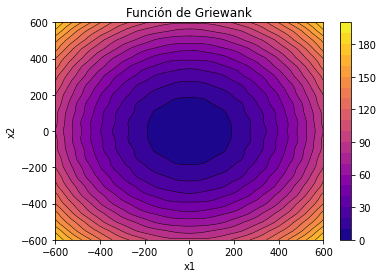

In [96]:
# Crear un gráfico de contorno con valores numéricos
levels = np.arange(0, 201, 10)
cp = plt.contourf(x1, x2, Z, levels=levels, cmap='plasma')
plt.colorbar(cp)

# Agregar líneas de contorno
plt.contour(x1, x2, Z, levels=levels, colors='k', linewidths=0.5)

# Título y etiquetas de los ejes
plt.title("Función de Griewank")
plt.xlabel("x1")
plt.ylabel("x2")

# Mostrar el gráfico
plt.show()

###Funcion Griewank 3D

In [97]:
# Cálculo de la función
z = f_griewank2d(X1, X2)

# Creación de la figura
fig = go.Figure(data=[go.Surface(x=X1, y=X2, z=z)])

# Personalización de la figura
fig.update_layout(
    title='Función de Griewank 2D',
    scene = dict(
        xaxis_title='X1',
        yaxis_title='X2',
        zaxis_title='griewank(X1,X2)',
        aspectmode='cube',
        camera=dict(
            eye=dict(x=1.75, y=-1.75, z=1.25)
        )
    )
)

# Mostrar la figura
fig.show()

##Optimización

###Descenso por gradiente

####En 2 dimensiones

In [98]:
def griewank(x):
    n = x.shape[0]
    sum = np.sum(x**2)
    prod = np.prod(np.cos(x / np.sqrt(np.arange(1, n+1))))
    return 1 + sum / 4000 - prod

def griewank_gradient(x):
    n = x.shape[0]
    prod = np.prod(np.cos(x / np.sqrt(np.arange(1, n+1))))
    grad = np.zeros(n)
    for i in range(n):
        grad[i] = x[i] / 2000 + (1 / np.sqrt(i+1)) * prod * np.sin(x[i] / np.sqrt(i+1))
    return grad

def griewank_hessian(x):
    n = x.shape[0]
    prod = np.prod(np.cos(x / np.sqrt(np.arange(1, n+1))))
    H = np.zeros((n, n))
    for i in range(n):
        for j in range(i, n):
            if i == j:
                H[i][j] = 1 / 2000 + (1 / (i+1)) * prod * (1 - (np.sin(x[i] / np.sqrt(i+1)))**2)
            else:
                pij = np.prod(np.cos(x / np.sqrt(np.arange(1, n+1)))[:i]) * np.prod(np.cos(x / np.sqrt(np.arange(1, n+1)))[i+1:j])
                H[i][j] = (-1 / ((i-j)**2)) * (np.sin(x[i] / np.sqrt(i+1))) * (np.sin(x[j] / np.sqrt(j+1))) * prod * pij
                H[j][i] = H[i][j]
    return H

def newton_raphson_optimization(x, max_iter=100, eps=1e-6):
    path = [x]
    for i in range(max_iter):
        grad = griewank_gradient(x)
        H = griewank_hessian(x)
        delta_x = np.linalg.solve(H, -grad)
        x = x + delta_x
        path.append(x)
        if np.linalg.norm(delta_x) < eps:
            break
    return x, path

In [99]:
griewank_scale = 600 / 3  # Scale factor for desired range of [-600, 600] (3 standard deviations)
griewank_init_point_2D = griewank_scale * np.random.randn(2)
griewank_init_point_2D = np.clip(griewank_init_point_2D, -600, 600)  # Clip values outside of the desired range
griewank_min_2D, griewank_path_2D = newton_raphson_optimization(griewank_init_point_2D, max_iter= 10000, )

#Impresión de resultados
print(f"Init value: {griewank_init_point_2D}")
print(f"Minimum: {griewank_min_2D}")
print(f"Function value at minimum: {griewank(griewank_min_2D)}")
print("Optimization path: ")
for point in griewank_path_2D:
    print(f"Punto evaluado:{point}--", f"Valor de la función en el punto: {griewank(point)}")

Init value: [123.19314104 157.12916578]
Minimum: [113.03936736 292.92770427]
Function value at minimum: 24.6705759406659
Optimization path: 
Punto evaluado:[123.19314104 157.12916578]-- Valor de la función en el punto: 10.64758018487846
Punto evaluado:[122.2206976 155.3213116]-- Valor de la función en el punto: 9.818424479419075
Punto evaluado:[121.80896229 154.9415766 ]-- Valor de la función en el punto: 10.013159402697928
Punto evaluado:[119.52440825 152.69242478]-- Valor de la función en el punto: 10.001153451677888
Punto evaluado:[117.41948147 139.19423043]-- Valor de la función en el punto: 9.096646968821457
Punto evaluado:[116.96154685 138.32751934]-- Valor de la función en el punto: 8.519646694657398
Punto evaluado:[118.77074332 139.96075913]-- Valor de la función en el punto: 9.418110215801402
Punto evaluado:[146.96085397 194.29637299]-- Valor de la función en el punto: 16.349189808025695
Punto evaluado:[151.60421321 187.51453025]-- Valor de la función en el punto: 14.984490411

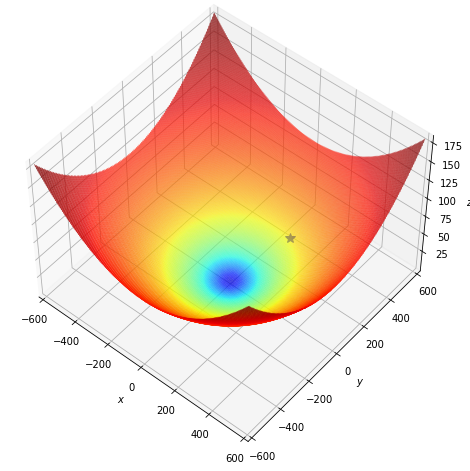

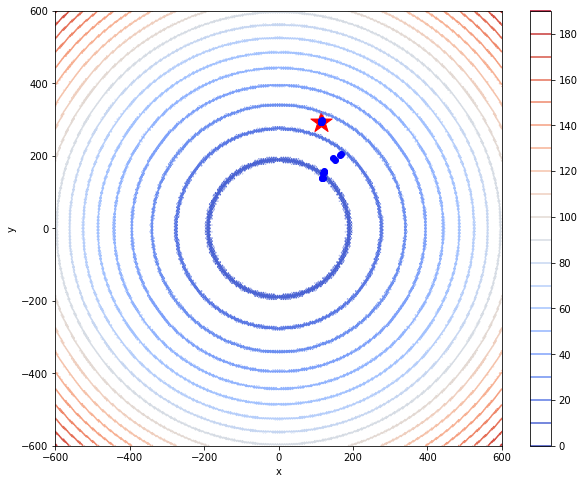

In [100]:
# Generate a grid of x, y values
gwk_x_min, gwk_x_max, gwk_x_maxvalues = -600,600, 600
gwk_y_min, gwk_y_max, gwk_y_maxvalues = -600, 600, 600

x_griewank = np.linspace(gwk_x_min, gwk_x_max, gwk_x_maxvalues)
y_griewank = np.linspace(gwk_y_min, gwk_y_max, gwk_y_maxvalues)
X_griewank, Y_griewank = np.meshgrid(x_griewank, y_griewank)
# Compute the Rastrigin function for each (x, y) pair
Z_griewank = np.zeros_like(X_griewank)
for i in range(X_griewank.shape[0]):
    for j in range(X_griewank.shape[1]):
        Z_griewank[i, j] = griewank(np.array([X_griewank[i, j], Y_griewank[i, j]]))


griewank_minimum= griewank_min_2D.reshape(-1, 1)

#Plot Griewank surface and minimum point founded.

griewank_surface_fig = plt.figure(figsize=(10,8))
griewank_surface_axes = plt.axes(projection='3d', elev=50, azim=-50)

griewank_surface_axes.plot_surface(X_griewank, Y_griewank, Z_griewank, norm=LogNorm(), rstride=1, cstride=1, 
                edgecolor='none', alpha=1, cmap=plt.cm.jet)
griewank_surface_axes.plot(*griewank_minimum, griewank(griewank_minimum), 'b*', markersize=10)

griewank_surface_axes.set_xlabel('$x$')
griewank_surface_axes.set_ylabel('$y$')
griewank_surface_axes.set_zlabel('$z$')

griewank_surface_axes.set_xlim((gwk_x_min, gwk_x_max))
griewank_surface_axes.set_ylim((gwk_y_min, gwk_y_max))

plt.show()

# Create a 2D contour plot of the Griewank function and plot the optimization path
griewank_contour_fig, griewank_contour_axes = plt.subplots(figsize=(10,8))
griewank_contour = griewank_contour_axes.contour(X_griewank, Y_griewank, Z_griewank, levels=20, cmap='coolwarm')
griewank_contour_axes.set_xlabel('x')
griewank_contour_axes.set_ylabel('y')

for point in griewank_path_2D:
  griewank_contour_axes.plot(*point, 'o-',color='blue',alpha=1)  

# Add a marker for the global minimum at (0, 0)
griewank_contour_axes.scatter(*griewank_minimum, marker='*', s=500, color='red')
plt.colorbar(griewank_contour)
plt.show()

####Animación descenso

<ipython-input-101-b0003eec6dde>:4: MatplotlibDeprecationWarning:

Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later

<ipython-input-101-b0003eec6dde>:4: MatplotlibDeprecationWarning:

Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later



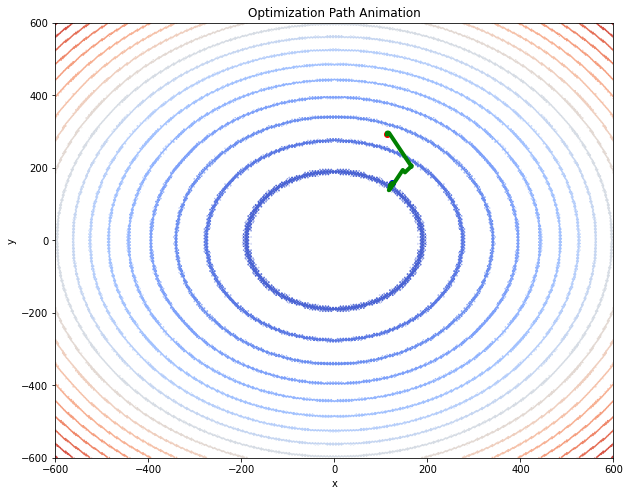

In [101]:
# Define the function to update the animation
def update(frame):
    x = griewank_path_2D[frame]
    line.set_data(x[0], x[1])
    if frame > 0:
        line_trace.set_data([griewank_path_2D[i][0] for i in range(frame+1)], [griewank_path_2D[i][1] for i in range(frame+1)])
    return line, line_trace
# Set the starting point for the optimization
# x_start = np.array([-4, 4])

# Run the optimization
# x_opt, path = newton_raphson_optimization(x_start)

# Plot the contour and the starting point
griewank_contour_fig, griewank_contour_axes = plt.subplots(figsize=(10,8))
griewank_contour_axes.set_title('Optimization Path Animation')
griewank_contour_axes.set_xlabel('x')
griewank_contour_axes.set_ylabel('y')
griewank_contour = griewank_contour_axes.contour(X_griewank, Y_griewank, Z_griewank, levels=20, cmap='coolwarm')
griewank_contour_axes.plot(griewank_init_point_2D[0], griewank_init_point_2D[1], 'o', color='blue')

# Set up the animation

line, = griewank_contour_axes.plot([], [], 'o-', color='red', lw=2)
line_trace, = griewank_contour_axes.plot([], [], '-', color='green', lw=4)
ani = animation.FuncAnimation(griewank_contour_fig, update, frames=len(griewank_path_2D), interval=200, blit=True)

HTML(ani.to_jshtml())

####En 3 dimensiones

In [102]:
griewank_scale = 600 / 3  # Scale factor for desired range of [-600, 600] (3 standard deviations)
griewank_init_point_3D = griewank_scale * np.random.randn(3)
griewank_init_point_3D = np.clip(griewank_init_point_3D, -600, 600)  # Clip values outside of the desired range
griewank_min_3D, griewank_path_3D = newton_raphson_optimization(griewank_init_point_3D, max_iter= 10000, )

#Impresión de resultados
print(f"Init value: {griewank_init_point_3D}")
print(f"Minimum: {griewank_min_3D}")
print(f"Function value at minimum: {griewank(griewank_min_3D)}")
print("Optimization path: ")
for point in griewank_path_3D:
    print(f"Punto evaluado:{point}--", f"Valor de la función en el punto: {griewank(point)}")

Init value: [233.46645768 -47.47334328 -28.77631281]
Minimum: [175.83507386  -8.87627787 369.41057346]
Function value at minimum: 41.92970015343
Optimization path: 
Punto evaluado:[233.46645768 -47.47334328 -28.77631281]-- Valor de la función en el punto: 15.210646148034382
Punto evaluado:[232.88503284 -49.84669183 -24.65872329]-- Valor de la función en el punto: 15.261625414874201
Punto evaluado:[230.62785343 -48.82213876 -26.33929086]-- Valor de la función en el punto: 15.308220908034725
Punto evaluado:[300.72152234 -43.9380434  -57.33683722]-- Valor de la función en el punto: 24.983373643660773
Punto evaluado:[302.52562412 -41.79515375 -66.32188147]-- Valor de la función en el punto: 25.558857884534397
Punto evaluado:[303.72559449 -41.59920479 -66.03461459]-- Valor de la función en el punto: 25.382794925634826
Punto evaluado:[303.90520955 -39.59369705 -63.13135191]-- Valor de la función en el punto: 25.273198083955947
Punto evaluado:[302.23619872 -39.76789416 -67.1670813 ]-- Valor d

###Algoritmos evolutivos

####En 2 dimensiones

In [103]:
# Definir los límites de los parámetros
limite_inferior = -5.0
limite_superior = 5.0

# Definir los parámetros del algoritmo genético
num_generaciones = 50
tamano_poblacion = 100
probabilidad_mutacion = 0.2
probabilidad_cruce = 0.5

# Crear los tipos de objeto para el problema
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individuo", list, fitness=creator.FitnessMin)

# Crear la caja de herramientas del algoritmo genético
toolbox = base.Toolbox()
toolbox.register("attr_float", random.uniform, limite_inferior, limite_superior)
toolbox.register("individuo", tools.initCycle, creator.Individuo,
                 (toolbox.attr_float, toolbox.attr_float), n=1)
toolbox.register("poblacion", tools.initRepeat, list, toolbox.individuo)

# Definir la función de evaluación
def evaluar(individuo):
    return f_griewank2d(individuo[0], individuo[1]),

# Definir los operadores genéticos
toolbox.register("evaluate", evaluar)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.1)
toolbox.register("select", tools.selTournament, tournsize=3)

# Crear la población inicial
poblacion = toolbox.poblacion(n=tamano_poblacion)

# Ejecutar el algoritmo genético
for generacion in range(num_generaciones):
    # Seleccionar a los padres
    padres = toolbox.select(poblacion, len(poblacion))
    # Clonar los padres para aplicar operadores genéticos
    hijos = list(map(toolbox.clone, padres))

    # Aplicar cruce y mutación a los hijos
    for hijo in hijos:
        if random.random() < probabilidad_cruce:
            toolbox.mate(hijo, random.choice(hijos))
            del hijo.fitness.values

        if random.random() < probabilidad_mutacion:
            toolbox.mutate(hijo)
            del hijo.fitness.values

    # Evaluar la aptitud de los nuevos individuos
    individuos_nuevos = [individuo for individuo in hijos if not individuo.fitness.valid]
    aptitudes_nuevas = toolbox.map(toolbox.evaluate, individuos_nuevos)
    for individuo, aptitud in zip(individuos_nuevos, aptitudes_nuevas):
        individuo.fitness.values = aptitud

    # Reemplazar la población anterior por la nueva generación
    poblacion = hijos

# Seleccionar al mejor individuo
mejor_individuo = tools.selBest(poblacion, 1)[0]
print("Mejor solución encontrada:", mejor_individuo)
print("Valor de la función objetivo:", mejor_individuo.fitness.values[0])

Mejor solución encontrada: [4.747390906175792e-09, 1.2066188262849533e-08]
Valor de la función objetivo: 0.0


/usr/local/lib/python3.9/dist-packages/deap/creator.py:138: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/usr/local/lib/python3.9/dist-packages/deap/creator.py:138: RuntimeWarning:

A class named 'Individuo' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.



####En 3 dimensiones

In [104]:
# Definir los límites de los parámetros
limite_inferior = -5.0
limite_superior = 5.0

# Definir los parámetros del algoritmo genético
num_generaciones = 50
tamano_poblacion = 100
probabilidad_mutacion = 0.2
probabilidad_cruce = 0.5

# Crear los tipos de objeto para el problema
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individuo", list, fitness=creator.FitnessMin)

# Crear la caja de herramientas del algoritmo genético
toolbox = base.Toolbox()
toolbox.register("attr_float", random.uniform, limite_inferior, limite_superior)
toolbox.register("individuo", tools.initRepeat, creator.Individuo,
                 toolbox.attr_float, n=3)
toolbox.register("poblacion", tools.initRepeat, list, toolbox.individuo)

# Definir la función de evaluación
def evaluar(individuo):
    return f_griewank3d(individuo[0], individuo[1], individuo[2]),

# Definir los operadores genéticos
toolbox.register("evaluate", evaluar)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.1)
toolbox.register("select", tools.selTournament, tournsize=3)

# Crear la población inicial
poblacion = toolbox.poblacion(n=tamano_poblacion)

# Ejecutar el algoritmo genético
for generacion in range(num_generaciones):
    # Seleccionar a los padres
    padres = toolbox.select(poblacion, len(poblacion))
    # Clonar los padres para aplicar operadores genéticos
    hijos = list(map(toolbox.clone, padres))

    # Aplicar cruce y mutación a los hijos
    for hijo in hijos:
        if random.random() < probabilidad_cruce:
            toolbox.mate(hijo, random.choice(hijos))
            del hijo.fitness.values

        if random.random() < probabilidad_mutacion:
            toolbox.mutate(hijo)
            del hijo.fitness.values

    # Evaluar la aptitud de los nuevos individuos
    individuos_nuevos = [individuo for individuo in hijos if not individuo.fitness.valid]
    aptitudes_nuevas = toolbox.map(toolbox.evaluate, individuos_nuevos)
    for individuo, aptitud in zip(individuos_nuevos, aptitudes_nuevas):
        individuo.fitness.values = aptitud

    # Reemplazar la población anterior por la nueva generación
    poblacion = hijos

# Seleccionar al mejor individuo
mejor_individuo = tools.selBest(poblacion, 1)[0]
print("Mejor solución encontrada:", mejor_individuo)
print("Valor de la función objetivo:", mejor_individuo.fitness.values[0])


Mejor solución encontrada: [-3.1399945437043204, 4.438443294942685, -0.00010493497469763599]
Valor de la función objetivo: 0.007396042567157535


###Optimizacion de particulas

####En 2 dimensiones

In [105]:
lb = [-5, -5]  # límite inferior de las variables
ub = [5, 5]    # límite superior de las variables

x_opt, f_opt = pso(lambda x: f_griewank2d(x[0], x[1]), lb, ub)

print("El punto óptimo es:", x_opt)

Stopping search: Swarm best objective change less than 1e-08
El punto óptimo es: [7.62392817e-05 3.72479020e-05]


####En 3 dimensiones

In [106]:
lb = [-10, -10, -10]  # límite inferior de las variables
ub = [10, 10, 10]     # límite superior de las variables

x_opt, f_opt = pso(lambda x: f_griewank3d(x[0], x[1], x[2]), lb, ub)

print("El punto óptimo es:", x_opt)

Stopping search: Swarm best objective change less than 1e-08
El punto óptimo es: [-9.42018427e+00 -1.40567764e-04  5.43313114e+00]


###Optimizacion por evolucion diferencial

####En 2 dimensiones

In [107]:
# Definir los parámetros de la evolución diferencial
F = 0.5 # factor de amplificación
CR = 0.9 # tasa de recombinación
NP = 20 # tamaño de la población
ngen = 100 # número de generaciones

# Definir el límite inferior y superior para los valores de x e y
lim_inf = -10
lim_sup = 10

# Generar la población inicial de forma aleatoria
pop = []
for i in range(NP):
    x = random.uniform(lim_inf, lim_sup)
    y = random.uniform(lim_inf, lim_sup)
    pop.append((x, y))

# Realizar la evolución diferencial
for gen in range(ngen):
    for i in range(NP):
        # Seleccionar 3 individuos de forma aleatoria
        a, b, c = random.sample(pop, 3)

        # Seleccionar un número aleatorio para cada variable
        R1, R2 = random.random(), random.random()

        # Realizar la mutación diferencial
        x_new = np.clip(a[0] + F*(b[0] - c[0]), lim_inf, lim_sup)
        y_new = np.clip(a[1] + F*(b[1] - c[1]), lim_inf, lim_sup)

        # Realizar la recombinación
        if random.random() < CR:
            x = x_new
            y = y_new
        else:
            x = a[0]
            y = a[1]

        # Evaluar la función en el nuevo individuo
        fitness_new = f_griewank2d(x, y)

        # Reemplazar el individuo anterior si el nuevo individuo es mejor
        if fitness_new < f_griewank2d(pop[i][0], pop[i][1]):
            pop[i] = (x, y)

# Imprimir el mejor individuo encontrado
best_ind = min(pop, key=lambda x: f_griewank2d(x[0], x[1]))
print('Valor mínimo de la función: ', f_griewank2d(best_ind[0], best_ind[1]))
print('Variables que producen el valor mínimo: ', best_ind)

Valor mínimo de la función:  0.009864672061006163
Variables que producen el valor mínimo:  (6.280045274459357, -2.0715193155954855e-09)


####En 3 dimensiones

In [108]:
# Definir los parámetros de la evolución diferencial
F = 0.5 # factor de amplificación
CR = 0.9 # tasa de recombinación
NP = 20 # tamaño de la población
ngen = 100 # número de generaciones

# Definir el límite inferior y superior para los valores de x, y, y z
lim_inf = -10
lim_sup = 10

# Generar la población inicial de forma aleatoria
pop = []
for i in range(NP):
    x = random.uniform(lim_inf, lim_sup)
    y = random.uniform(lim_inf, lim_sup)
    z = random.uniform(lim_inf, lim_sup)
    pop.append((x, y, z))

# Realizar la evolución diferencial
for gen in range(ngen):
    for i in range(NP):
        # Seleccionar 3 individuos de forma aleatoria
        a, b, c = random.sample(pop, 3)

        # Seleccionar un número aleatorio para cada variable
        R1, R2, R3 = random.random(), random.random(), random.random()

        # Realizar la mutación diferencial
        x_new = np.clip(a[0] + F*(b[0] - c[0]), lim_inf, lim_sup)
        y_new = np.clip(a[1] + F*(b[1] - c[1]), lim_inf, lim_sup)
        z_new = np.clip(a[2] + F*(b[2] - c[2]), lim_inf, lim_sup)

        # Realizar la recombinación
        if random.random() < CR:
            x = x_new
            y = y_new
            z = z_new
        else:
            x = a[0]
            y = a[1]
            z = a[2]

        # Evaluar la función en el nuevo individuo
        fitness_new = f_griewank3d(x, y, z)

        # Reemplazar el individuo anterior si el nuevo individuo es mejor
        if fitness_new < f_griewank3d(pop[i][0], pop[i][1], pop[i][2]):
            pop[i] = (x, y, z)

# Imprimir el mejor individuo encontrado
best_ind = min(pop, key=lambda x: f_griewank3d(x[0], x[1], x[2]))
print('Valor mínimo de la función: ', f_griewank3d(best_ind[0], best_ind[1], best_ind[2]))
print('Variables que producen el valor mínimo: ', best_ind)


Valor mínimo de la función:  0.024163457287327272
Variables que producen el valor mínimo:  (-3.139995915781143, -4.438368982852646, 0.3173887072792754)
